## CS4243 Lab 4: Feature Matching and Applications

**Deadline: Apr 24, 2026, 22:00 SGT**

**Instructions:**
- See `lab4.pdf` and `lab4.py` for detailed descriptions.

- The functions to be implemented are given in `lab4.py`, with a description of each function. You will need to fill in the code where it is marked with the following:
    ```
    """ Your code starts here """

    """ Your code ends here """
    ```
    
- For open questions, write your answers directly into the notebook. 

- The test images are given in folder `data/input` and sample outputs are provided in `data/output`.

- You are free to use NumPy functions, but you may not use built-in functions of OpenCV aside from those already in the code template. Exceptions will be explicitly stated.

**Attention:**
- Please use python with version >= 3.8.4, and install the libs provided in requirements.txt via `pip install -r requirements.txt`.
- Please do not change the structure of files in the whole folder of this assignment, otherwise TA may mark your code wrongly.
- Please do not change the inputs arguments of the functions in `lab4.py`, otherwise your implementation would fail to pass the test.
- The functions in `utils.py` are to help us and should not have to be changed. Nonetheless, feel free to make adjustments if there are issues on your end.
- As long as your output is close to the expected answer, you will get full credit.

**Submission instructions:**

Upload to Canvas your completed `lab4.py` and `lab4.ipynb` by zipping them into a file named AXXX1_AXXX2.zip, where AXXX is the student number of the group members. Submit one file per group. Missing files, incorrectly formatted code that does not run, etc. will be penalized.

Tanuj is the TA in charge of this lab. Please post any questions onto the Canvas forum or attend one of the FAQ sessions during the regularly scheduled Lab session on 13.04 or 15.04.

In [1]:
import numpy as np
from skimage import filters
from skimage.feature import corner_peaks
import matplotlib.pyplot as plt
import cv2

In [2]:
from lab4 import *
from utils import *
%load_ext autoreload
%autoreload 2

import warnings
warnings.filterwarnings("ignore")

Failed to read module file 'c:\Users\simeng\AppData\Local\Programs\Python\Python313\Lib\zipfile\_path\__init__.py' for module 'zipfile._path': UnicodeDecodeError
Traceback (most recent call last):
  File "C:\Users\simeng\AppData\Roaming\Python\Python313\site-packages\IPython\core\extensions.py", line 62, in load_extension
    return self._load_extension(module_str)
           ~~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^
  File "C:\Users\simeng\AppData\Roaming\Python\Python313\site-packages\IPython\core\extensions.py", line 77, in _load_extension
    mod = import_module(module_str)
  File "c:\Users\simeng\AppData\Local\Programs\Python\Python313\Lib\importlib\__init__.py", line 88, in import_module
    return _bootstrap._gcd_import(name[level:], package, level)
           ~~~~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "<frozen importlib._bootstrap>", line 1387, in _gcd_import
  File "<frozen importlib._bootstrap>", line 1360, in _find_and_load
  File "<frozen importlib._bootstrap>", lin

## Part 1: Keypoint Detection, Description, and Matching (40%)

### 1.1 Keypoint detection (7%)

We will start by implementing a simple detector.

**Goal**: Implement `harris_corners()` function and then run the code cells below.

Hint: You may use the function `scipy.ndimage.filters.convolve()`, which is already imported.

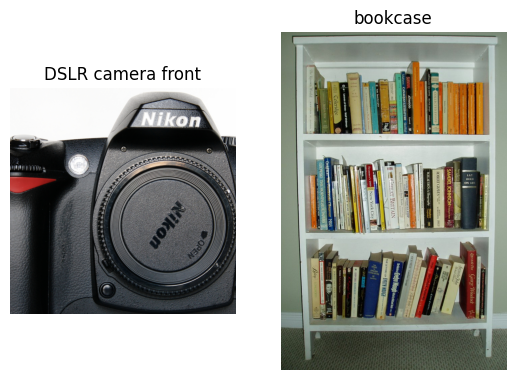

In [3]:
# Before working on the corner detectors, let's look at two man-made scenes with strong geometric corners.
plt.subplot(1,2,1)
plt.imshow(cv2_imread('data/input/dslr_front.png'))
plt.axis('off')
plt.title('DSLR camera front')

plt.subplot(1,2,2)
plt.imshow(cv2_imread('data/input/bookcase.png'))
plt.axis('off')
plt.title('bookcase')
plt.show()


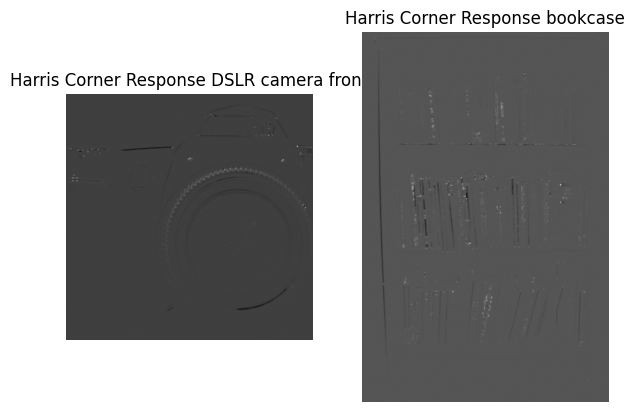

In [198]:
img1 = cv2.imread('data/input/dslr_front.png', 0)
img2 = cv2.imread('data/input/bookcase.png', 0)

# Compute Harris corner response
response1 = harris_corners(img1)
response2 = harris_corners(img2)

# Display corner response
plt.figure(figsize=(7,7))
plt.subplot(1,2,1)
plt.imshow(response1, cmap='gray')
plt.axis('off')
plt.title('Harris Corner Response DSLR camera front')

plt.subplot(1,2,2)
plt.imshow(response2, cmap='gray')
plt.axis('off')
plt.title('Harris Corner Response bookcase')
plt.show()


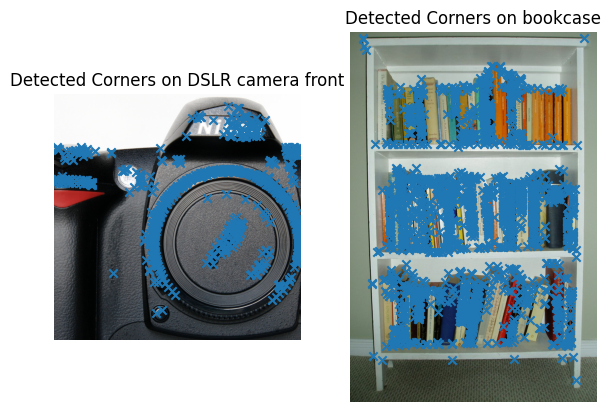

In [199]:
# Perform non-maximum suppression in response map
# and output corner coordiantes
corners1 = corner_peaks(response1, threshold_rel=0.01)
corners2 = corner_peaks(response2, threshold_rel=0.01)

# Display detected corners
plt.figure(figsize=(7,7))
plt.subplot(1,2,1)
plt.imshow(cv2_imread('data/input/dslr_front.png'))
plt.scatter(corners1[:,1], corners1[:,0], marker='x')
plt.axis('off')
plt.title('Detected Corners on DSLR camera front')

plt.subplot(1,2,2)
plt.imshow(cv2_imread('data/input/bookcase.png'))
plt.scatter(corners2[:,1], corners2[:,0], marker='x')
plt.axis('off')
plt.title('Detected Corners on bookcase')
plt.show()


Now, let's test our keypoint detector on a Tokyo travel poster and a rotated version.

**NOTE**: Don't remove the commented codes.


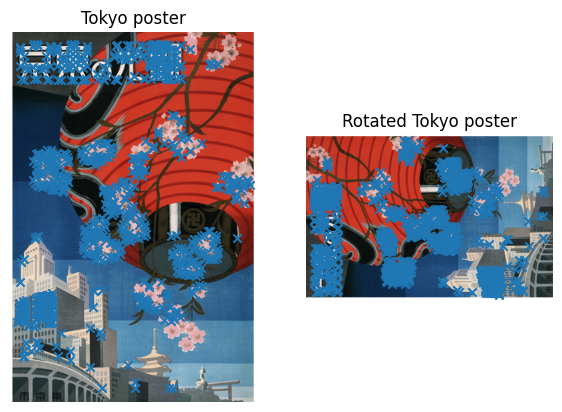

In [200]:
img1 = cv2.imread('data/input/tokyo_poster.png', 0)
img2 = cv2.imread('data/input/tokyo_poster_rotated.png', 0)
img1_c = cv2_imread('data/input/tokyo_poster.png')
img2_c = cv2_imread('data/input/tokyo_poster_rotated.png')

# Uncomment the four lines below later (COME BACK WHEN YOU REACH THE EXPLORATORY SECTION)
img1 = cv2.imread('data/input/tokyo_poster.png', 0)
img2 = cv2.imread('data/input/tokyo_poster_right_angle.png', 0)
img1_c = cv2_imread('data/input/tokyo_poster.png')
img2_c = cv2_imread('data/input/tokyo_poster_right_angle.png')

# Detect keypoints in two images
keypoints1 = corner_peaks(harris_corners(img1, window_size=3),
                          threshold_rel=0.05,
                          exclude_border=8)
keypoints2 = corner_peaks(harris_corners(img2, window_size=3),
                          threshold_rel=0.05,
                          exclude_border=8)

# Display detected keypoints
plt.figure(figsize=(7,7))
plt.subplot(1,2,1)
plt.imshow(img1_c)
plt.scatter(keypoints1[:,1], keypoints1[:,0], marker='x')
plt.axis('off')
plt.title('Tokyo poster')

plt.subplot(1,2,2)
plt.imshow(img2_c)
plt.scatter(keypoints2[:,1], keypoints2[:,0], marker='x')
plt.axis('off')
plt.title('Rotated Tokyo poster')
plt.show()


### 1.2 Keypoint description (15%)

After we are able to identify the keypoints, we will move on to the next part: describing these keypoints.

**Goal**: Implement the `naive_descriptor()` and `simple_sift()` functions before proceeding to the next section. 

We provide you the function `describe_keypoints()` which takes as argument an image, a list of keypoints on that image, a descriptor function, and patch size. For each keypoint on the image, a region equal to patch size will be extracted, and the descriptor function is used to describe that region. 

### 1.3 Keypoint matching (8%) 


**Goal**: Implement `top_k_matches()` and `ratio_test_match()`.

Next, let's see our descriptors and "matcher" in action.

In [201]:
# Don't change this
NAIVE_DESC_PATCH_SIZE = 5
SIMPLE_SIFT_PATCH_SIZE = 16

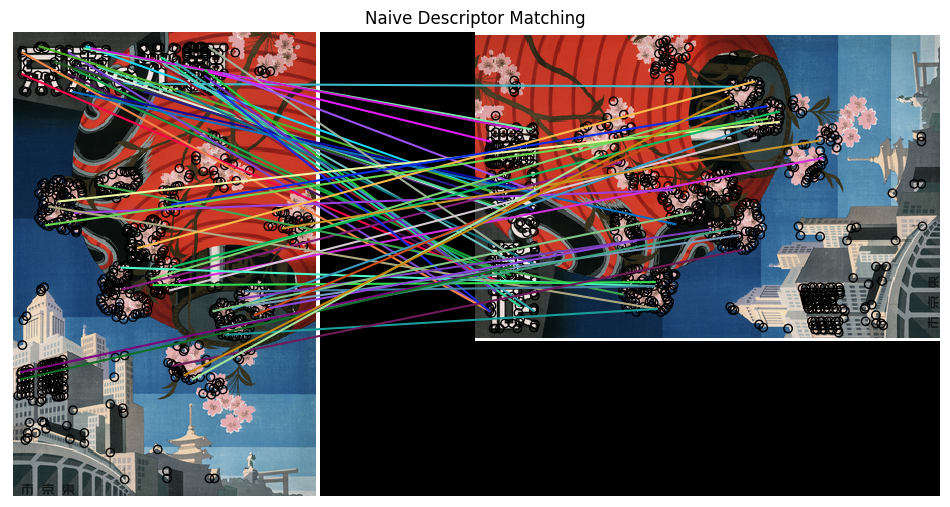

In [202]:
# Extract features from the corners
desc1 = describe_keypoints(img1, keypoints1,
                           desc_func=naive_descriptor,
                           patch_size=NAIVE_DESC_PATCH_SIZE)
desc2 = describe_keypoints(img2, keypoints2,
                           desc_func=naive_descriptor,
                           patch_size=NAIVE_DESC_PATCH_SIZE)

# Match descriptors in image1 to those in image2

match_threshold = 0.7
matches = ratio_test_match(desc1, desc2, match_threshold)

# Plot matches
fig, ax = plt.subplots(1, 1, figsize=(12, 9))
ax.axis('off')
plot_matches(ax, img1_c, img2_c, keypoints1, keypoints2, matches)
plt.title("Naive Descriptor Matching")
plt.show()



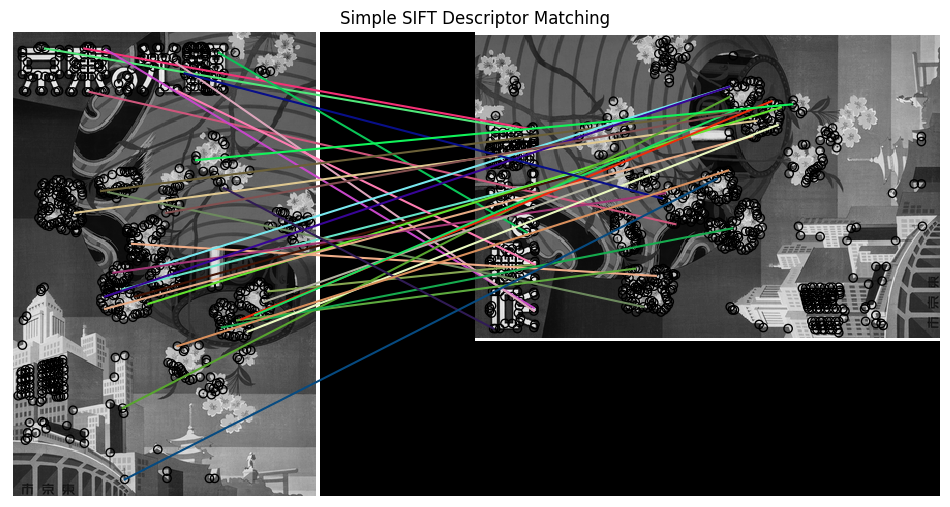

In [203]:
# Detect keypoints in both images
keypoints1 = corner_peaks(harris_corners(img1, window_size=3),
                          threshold_rel=0.05,
                          exclude_border=8)
keypoints2 = corner_peaks(harris_corners(img2, window_size=3),
                          threshold_rel=0.05,
                          exclude_border=8)

# Extract features from the corners
desc1 = describe_keypoints(img1, keypoints1,
                           desc_func=simple_sift,
                           patch_size=SIMPLE_SIFT_PATCH_SIZE)
desc2 = describe_keypoints(img2, keypoints2,
                           desc_func=simple_sift,
                           patch_size=SIMPLE_SIFT_PATCH_SIZE)

# Match descriptors in image1 to those in image2
match_threshold = 0.75
matches = ratio_test_match(desc1, desc2, match_threshold)

# Plot matches
fig, ax = plt.subplots(1, 1, figsize=(12, 9))
ax.axis('off')
plot_matches(ax, img1, img2, keypoints1, keypoints2, matches)
plt.title("Simple SIFT Descriptor Matching")
plt.show()

**EXPLORATORY SECTION** : Where are the good matches? **(10%)**

**Question 1** (3%): Discuss the trade-off between accepting false matches and rejecting correct matches. How does adjusting the match threshold (for ratio test) affect this?

**Answer**: By accepting more matches, the number of false matches (false positive) increases. By rejecting more matches, some correct matches that display weaker responses are also rejected, so the number of false negatives increases.

when the threshold is low, it indicates that the distance between point and first match should be much smaller than distance between point and second match. It is a stringent requirement, giving strong confidence in the matches selected but may at the risk of high false negative. 
When the threshold is high, it indicates that the distance between point and first match can be similar to the distance between point and the second match. It allows more ambiguity, resulting in more matches but at the risk of high false positive.

**Question 2** (3%): Compare the matching results that you get using `naive_descriptor()` and `simple_sift()`. Increase the value for `match_threshold` and rerun the cells. What do you observe?
    
**Answer**: The results for both are not really accute as there are almost no correct matches between the two images. But the results for simple_sift include a fiew more accurate than naive_descriptor.
When the match_threshold is increased, the requirement becomes less strict. There are more matches detected but there are also more inaccurate matches.

**Question 3** (4%): Remember the cell with commented codes? Uncomment those lines to run the describing and matching process again, using your two descriptors. In this case, the angle of rotation between the two images is 90 degree. What happens to your matching result using the simple SIFT descriptors this time? Suggest a reason. 

Also suggest ONE possible change that can be made to improve your SIFT version. 

**Answer**: The results become more accurate. This is because this version of SIFT is not really rotational invariant. Rotating the image by 90 degrees may result in a better performance than rotating it by around 30 degrees (for the test case before uncommenting the code). As 90 is a multiple of 45, which is the interval of the histogram bins, after rotating by 90, the histogram structure may still be similar to that of the source image. However, when rotated by 30 degrees, the histogram structure may change significantly , causing the descriptors of the same keypoint to be very different from the source image. 

One improvement would be finding the dominant orientation in the histogram and subtracting the dominant orientation from every orientation angle. This makes the descriptor relative to the keypoint orientation and becomes more stable to rotation.

## PART 2: Image Stitching (30%)

In this task, we will work on image stitching using a high-resolution historical map of Paris. Because the map is approximately planar and packed with small visual details, it is a good educational example for descriptor matching and homography estimation.

First, use your `simple_sift()` descriptor on two overlapping map panels: `paris_map_left.png` and `paris_map_right.png`. These two crops come from the same map and share a broad overlapping region.


**Test case 1**: Easy match. **(2%)** 


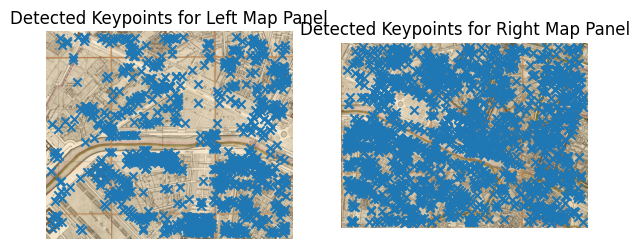

In [164]:
img1 = cv2.imread('data/input/paris_map_left.png', 0)
img2 = cv2.imread('data/input/paris_map_right.png', 0)

img1_c = cv2_imread('data/input/paris_map_left.png')
img2_c = cv2_imread('data/input/paris_map_right.png')

# Detect keypoints in two images
keypoints1 = corner_peaks(harris_corners(img1, window_size=3),
                          threshold_rel=0.05,
                          exclude_border=8)
keypoints2 = corner_peaks(harris_corners(img2, window_size=3),
                          threshold_rel=0.05,
                          exclude_border=8)

# Display detected keypoints
_ = plt.figure(figsize=(7,7))
plt.subplot(1,2,1)
plt.imshow(img1_c)
plt.scatter(keypoints1[:,1], keypoints1[:,0], marker='x')
plt.axis('off')
plt.title('Detected Keypoints for Left Map Panel')

plt.subplot(1,2,2)
plt.imshow(img2_c)
plt.scatter(keypoints2[:,1], keypoints2[:,0], marker='x')
plt.axis('off')
plt.title('Detected Keypoints for Right Map Panel')
plt.show()


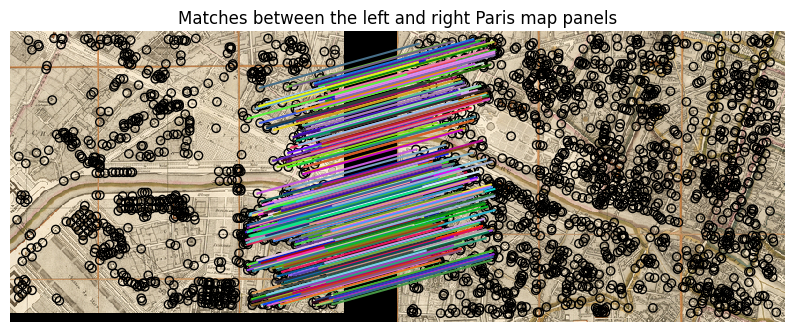

In [165]:
# Extract features from the corners
desc1 = describe_keypoints(img1, keypoints1,
                           desc_func=simple_sift,
                           patch_size=SIMPLE_SIFT_PATCH_SIZE)
desc2 = describe_keypoints(img2, keypoints2,
                           desc_func=simple_sift,
                           patch_size=SIMPLE_SIFT_PATCH_SIZE)

# Match descriptors in image1 to those in image2
# Feel free to change match_threshold, but keep the value to between 0.5-0.8
match_threshold = 0.5
matches = ratio_test_match(desc1, desc2, match_threshold)

# Plot matches
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.axis('off')
plot_matches(ax, img1_c, img2_c, keypoints1, keypoints2, matches)
plt.title('Matches between the left and right Paris map panels')
plt.show()


Expected answer:

<img src="data/output/paris_map_matches.png" width="400" height="300">


### 2.1 Image stitching using homography  (10%)

**Goal** Implement the function `compute_homography()`. 

##### Now let's see our stitching result.
(for this part, you may want to set `match_threshold` to 0.5)

This cell shows the direct homography stitching result.
The black region in the top-right is a normal artifact of warping and trimming.

Here `warp_image(...)` and the provided helper `trim(...)` are only used to visualize the stitched result by removing all-black borders after warping. They are not functions you need to implement for Part 2.

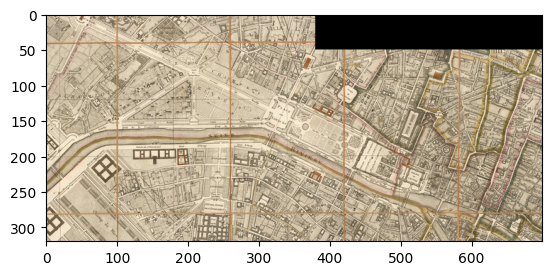

In [166]:
# Extract matched keypoints
p1 = keypoints1[matches[:,0]]
p2 = keypoints2[matches[:,1]]

# Compute Homography matrix H that maps p2 to p1
H = compute_homography(p1, p2)

final_im = trim(warp_image(img1_c, img2_c, H))
plt.imshow(final_im)

Expected answer:

<img src="data/output/paris_map_homography.png" width="400" height="300">


### 2.2 RANSAC (12%)

First, let's increase `match_threshold` to `0.75` and observe how the direct homography stitch degrades before applying RANSAC:


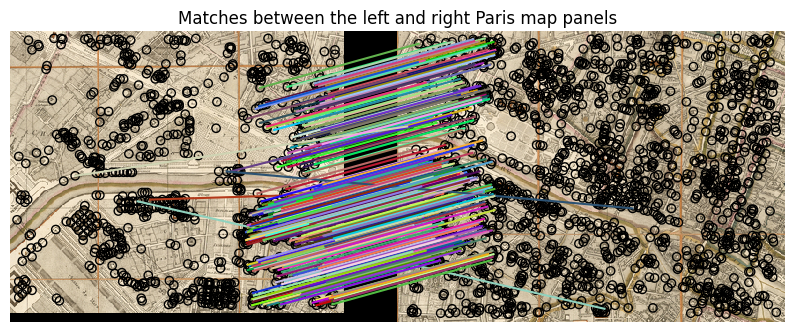

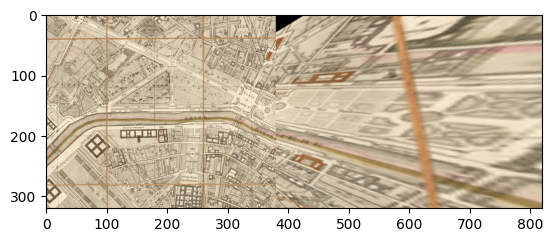

In [167]:
match_threshold = 0.75
matches = ratio_test_match(desc1, desc2, match_threshold)

# Plot matches
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.axis('off')
plot_matches(ax, img1_c, img2_c, keypoints1, keypoints2, matches)
plt.title('Matches between the left and right Paris map panels')
plt.show()

# Extract matched keypoints
p1 = keypoints1[matches[:,0]]
p2 = keypoints2[matches[:,1]]

# Compute Homography matrix H that maps p2 to p1
H = compute_homography(p1, p2)

final_im = trim(warp_image(img1_c, img2_c, H))
plt.imshow(final_im)


**Question** (2%): After changing the `match_threshold` to 0.75, is the stitching still accurate? If not, what do you think is the reason?

**Answer**: The stitching is not accurate. When the threshold is increased from 0.5 to 0.75, the quality of the matches accepted decreases, meaning that more incorrect matches will be accepted. The incorrect matches will affect the homography computed, making it no longer represent the true geometric relationship between the source and destination images, which will cause the stitching result to be inaccurate.  

Sometimes, the luxury of being able to use a low threshold does not belong to us and we face outliers. In this case, we can use RANSAC to pick out the inliers, following the algorithm taught in the lecture.

**Goal**: Implement the function `ransac_homography()`. 

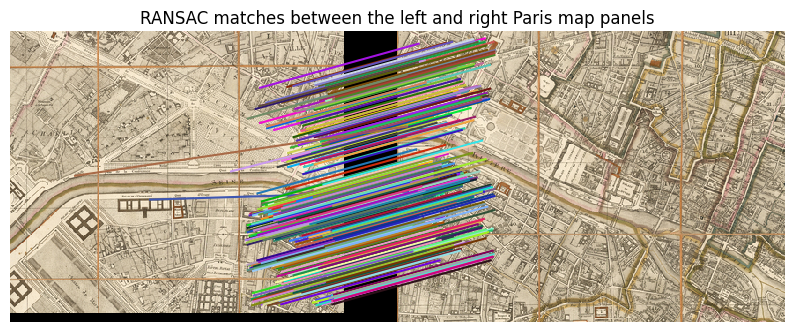

In [ ]:
# You can tune sampling_ratio, n_iters, and delta if necessary
H, robust_matches = ransac_homography(keypoints1, keypoints2, matches, sampling_ratio=0.2, n_iters=1000, delta=100)

# Visualize robust matches
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plt.axis('off')
plot_matches(ax, img1_c, img2_c, keypoints1, keypoints2, robust_matches, only_matches=True)
plt.title('RANSAC matches between the left and right Paris map panels')
plt.show()


Let's now see the stitching result with RANSAC's help.

The RANSAC result should look similar to the direct homography in overall scene content, but it should reduce the distortion caused by outlier matches.

(Here you may want to change the value for `sampling_ratio` and `delta`, run the cell above again. It's fine if your answer is not perfect as when `match_threshold` was `0.5`. Being close is good enough.)


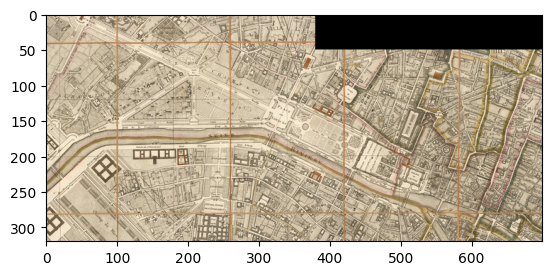

In [169]:
final_im = trim(warp_image(img1_c, img2_c, H))
plt.imshow(final_im)

Expected answer:

<img src="data/output/paris_map_ransac.png" width="400" height="300">


**Test case 2**: Harder match **(6%)**

Now, let's look at a harder example, where we replace the second image with `paris_map_rotated.png`. This crop still comes from the same historical map, but it has been rotated by 90 degrees relative to the left panel.

**Question** (3%): Run the cell below and observe the matching results. Do you see any match when `match_threshold` is 0.7? If yes, are the matches accurate? 

Increase the `match_threshold` to 0.85. What do you observe now? Do you think that the matches displayed are good? How would they affect the stitching result? Try and see if RANSAC can help here.

**Answer**: 
There are only two matches and they are not accurate.

When the treshold is 0.85, there are more matches but only a few of them are accurate. The large number of inaccurate matches will make the stitching result very unreliable. 

I don't think RANSAC can help here. There are too many inaccurate matches. When RANSAC is used, even the best homography computed only has very few inliers. Therefore the homography is still very inaccurate.


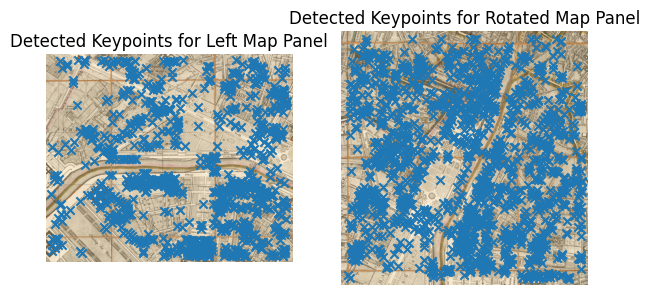

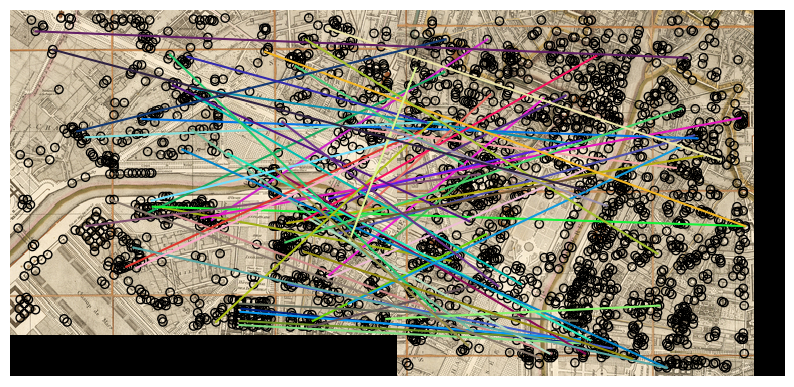

In [174]:
img1 = cv2.imread('data/input/paris_map_left.png', 0)
img2 = cv2.imread('data/input/paris_map_rotated.png', 0)

img1_c = cv2_imread('data/input/paris_map_left.png')
img2_c = cv2_imread('data/input/paris_map_rotated.png')

# Detect keypoints in two images
keypoints1 = corner_peaks(harris_corners(img1, window_size=3),
                          threshold_rel=0.05,
                          exclude_border=8)
keypoints2 = corner_peaks(harris_corners(img2, window_size=3),
                          threshold_rel=0.05,
                          exclude_border=8)

# Display detected keypoints
_ = plt.figure(figsize=(7,7))
plt.subplot(1,2,1)
plt.imshow(img1_c)
plt.scatter(keypoints1[:,1], keypoints1[:,0], marker='x')
plt.axis('off')
plt.title('Detected Keypoints for Left Map Panel')

plt.subplot(1,2,2)
plt.imshow(img2_c)
plt.scatter(keypoints2[:,1], keypoints2[:,0], marker='x')
plt.axis('off')
plt.title('Detected Keypoints for Rotated Map Panel')
plt.show()

# Extract features from the corners
desc1 = describe_keypoints(img1, keypoints1,
                           desc_func=simple_sift,
                           patch_size=SIMPLE_SIFT_PATCH_SIZE)
desc2 = describe_keypoints(img2, keypoints2,
                           desc_func=simple_sift,
                           patch_size=SIMPLE_SIFT_PATCH_SIZE)


# Match descriptors in image1 to those in image2
match_threshold = 0.85
matches = ratio_test_match(desc1, desc2, match_threshold)

# Plot matches
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.axis('off')
plot_matches(ax, img1_c, img2_c, keypoints1, keypoints2, matches)
plt.show()


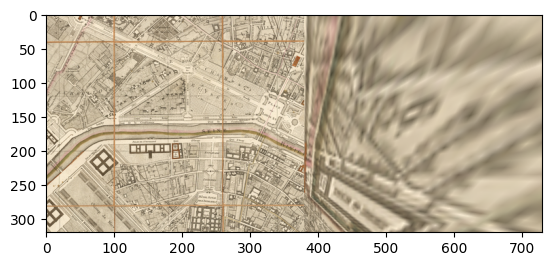

In [190]:
# Compute Homography matrix H that maps p2 to p1 using RANSAC
H = ransac_homography(keypoints1, keypoints2, matches, sampling_ratio=0.3, n_iters=3000, delta=100)[0]

final_im = trim(warp_image(img1_c, img2_c, H))
plt.imshow(final_im)

We provide you with a function `compute_cv2_descriptor()`, which both detects and describes keypoints on an image.
It also returns angles and sizes for the keypoints. A keypoint angle is the dominant orientation for that keypoint (do note that it is measured w.r.t to the x-axis, aka the "column" axis according to our convention). A keypoint size is the size for the keypoint; different keypoints do not need to have the same size.

You may notice that some keypoints have the same coordinates. As per the original paper, a new keypoint is created if there are more than one dominant orientation.

Let's see how this descriptor fare against our test case:

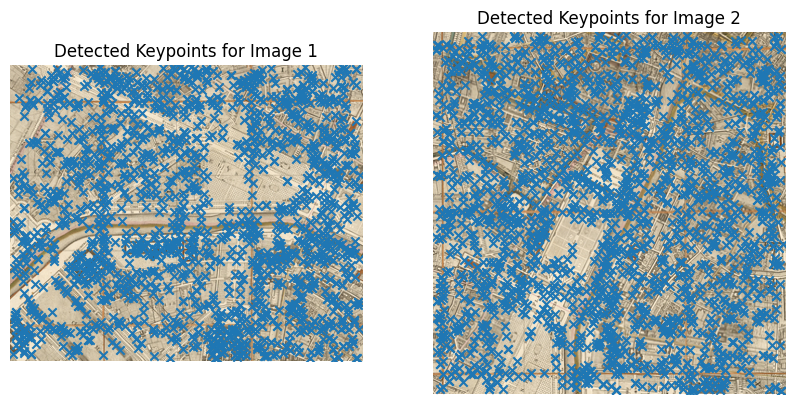

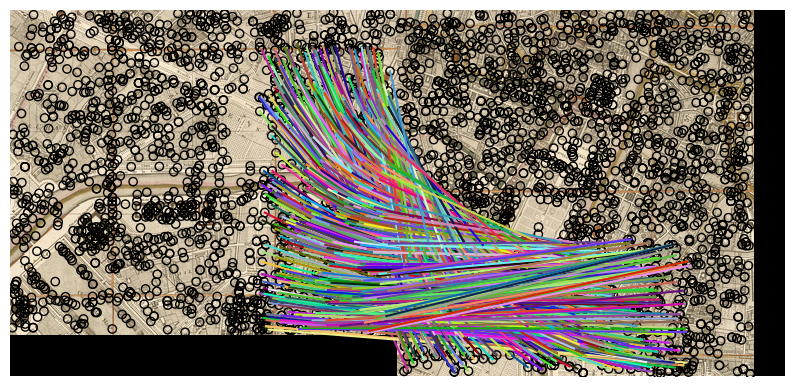

In [171]:
keypoints1, desc1, _, _ = compute_cv2_descriptor(img1_c)
keypoints2, desc2, _, _ = compute_cv2_descriptor(img2_c)

_ = plt.figure(figsize=(10,10))
plt.subplot(1,2,1)
plt.imshow(img1_c)
plt.scatter(keypoints1[:,1], keypoints1[:,0], marker='x')
plt.axis('off')
plt.title('Detected Keypoints for Image 1')

plt.subplot(1,2,2)
plt.imshow(img2_c)
plt.scatter(keypoints2[:,1], keypoints2[:,0], marker='x')
plt.axis('off')
plt.title('Detected Keypoints for Image 2')
plt.show()

# Match descriptors in image1 to those in image2

match_threshold = 0.6
matches = ratio_test_match(desc1, desc2, match_threshold)

# Plot matches
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.axis('off')
plot_matches(ax, img1_c, img2_c, keypoints1, keypoints2, matches)
plt.show()

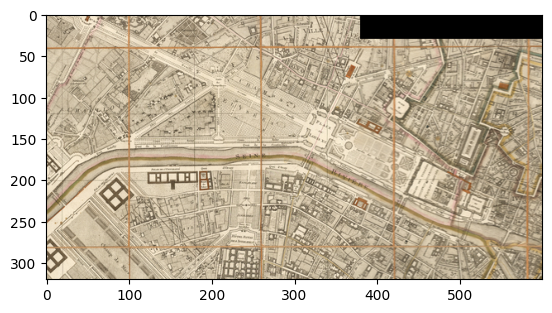

In [172]:
# You can run this cell after matching using the simple_sift, but the result is likely not good
# Extract matched keypoints
p1 = keypoints1[matches[:,0]]
p2 = keypoints2[matches[:,1]]

# Compute Homography matrix H that maps p2 to p1
H = compute_homography(p1, p2)

final_im = trim(warp_image(img1_c, img2_c, H))
plt.imshow(final_im)

Expected answer:

<img src="data/output/paris_map_rotated_cv2sift.png" width="350" height="300">


In part 3, we will do some simple detection of mirror symmetry, following the method detailed in the paper "[Detecting Symmetry and Symmetric Constellations of Features](http://www.cse.psu.edu/~yul11/CourseFall2006_files/loy_eccv2006.pdf)" (Loy and Eklundh, 2006). The described method leverages matching of feature points; each match pair is used to generate a parameter point that defines the reflection line. Hough Voting, the technique that you have learnt and experimented with for lab 2, will be used as well.

## PART 3: Mirror Symmetry Detection (30%)
   
We provide three functions for you: `angle_with_x_axis()`, `midpoint()`, and `distance()`.

**Test case 1**: Line of symmetry **(2%)**

First, let's look at the image of a moth and its mirrored version (over the vertical-axis):


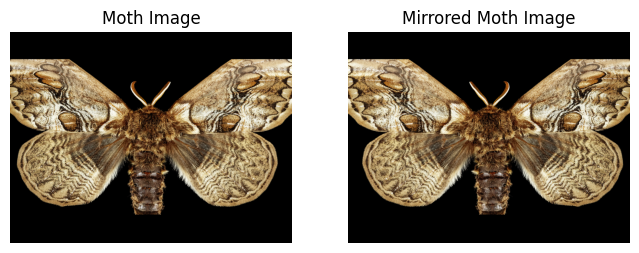

In [66]:
moth_path = "data/input/moth.png"
moth_im = cv2.imread(moth_path, 0)

mirror_moth_im = np.fliplr(moth_im)

moth_im_c = cv2_imread(moth_path)
m_moth_im_c = np.fliplr(moth_im_c)

plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.imshow(moth_im_c)
plt.axis('off')
plt.title('Moth Image')

plt.subplot(1,2,2)
plt.imshow(m_moth_im_c)
plt.axis('off')
plt.title('Mirrored Moth Image')
plt.show()


### 3.1 Generate descriptors and mirror descriptors for the images (6%)

**Goal**: Implement the function `shift_sift_descriptor()` and use it to implement `create_mirror_descriptors()`.

Hint: refer to `lab4.py`. You may also want to use the `compute_cv2_descriptor()` function on the flipped version of an image (using `np.fliplr`) and observe how the histogram changes.

### 3.2 Match keypoints from an image and the virtual descriptors (6%)


**Goal**: Implement the function `match_mirror_descriptors()`. 

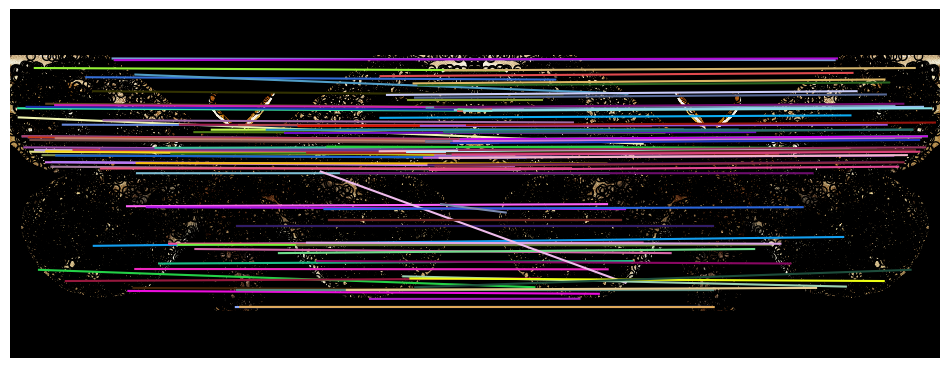

In [157]:
kps, descs, angles, sizes, mir_descs = create_mirror_descriptors(moth_im)
matches = match_mirror_descriptors(descs, mir_descs)
fig, ax = plt.subplots(1, 1, figsize=(12, 9))
ax.axis('off')
plot_mirror_matches(ax, moth_im_c, kps, matches) 
plt.show()


### 3.3 Generate symmetry line parameters (6%)

After collecting the pairs of matched keypoints from the previous step, we will make use of the point coordinates for each pair to vote for ρ and θ in a 2D Hough space.

**Goal**: Implement `find_symmetry_lines()`. Use this function to implement the next one.

### 3.4 Perform Hough voting for mirror line (6%)

**Goal**: Implement `hough_vote_mirror()`. 

Hint: the function `find_peak_params` is provided for you. Note that this function has two parameters, `window` and `threshold`, that can be adjusted.

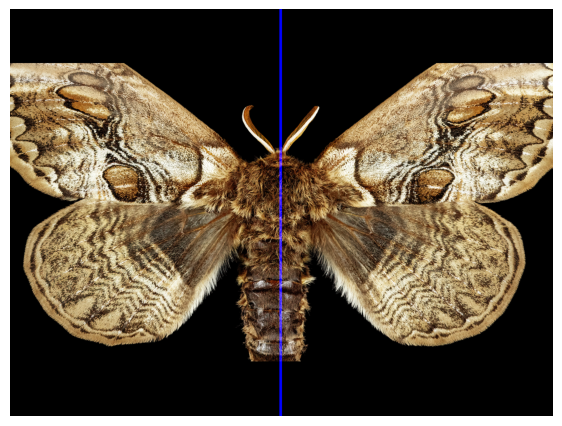

In [158]:
rhos, thetas = hough_vote_mirror(matches, kps, moth_im.shape, window=4, threshold=0.8, num_lines=1)
draw_mirror_line(moth_im_c.copy() , rhos, thetas)


Expected answer:

<img src="data/output/moth_symmetry.png" width="250" height="200">


Now, we will move to a harder facade image with more competing architectural edges.


**Test case 2**: Osborne House facade **(2%)**

The post-processing code below (filtering for vertical candidates) is provided to help you select a clean final symmetry line from the Hough-voting candidates.


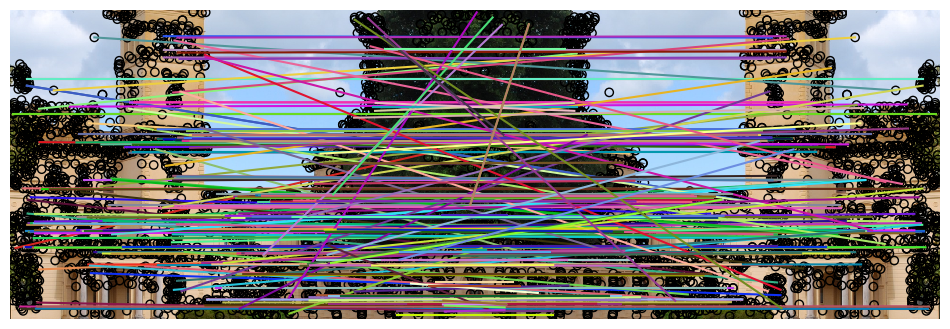

In [159]:
facade_path = "data/input/osborne_facade.png"
facade_im = cv2.imread(facade_path, 0)
facade_im_c = cv2_imread(facade_path)

facade_kps, facade_descs, _, _, mirr_facade_descs = create_mirror_descriptors(facade_im)
facade_matches = match_mirror_descriptors(facade_descs, mirr_facade_descs, threshold=0.8)

fig, ax = plt.subplots(1, 1, figsize=(12, 9))
ax.axis('off')
plot_mirror_matches(ax, facade_im_c, facade_kps, facade_matches)
plt.show()


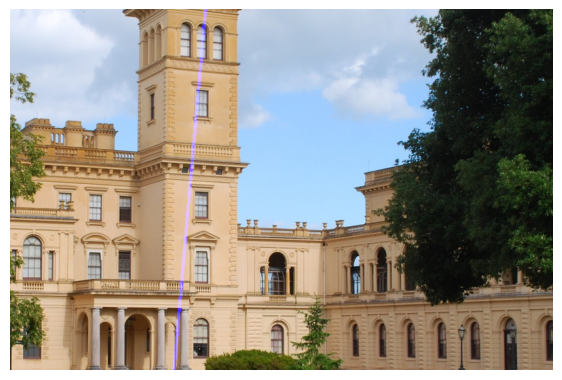

In [160]:
candidate_rhos, candidate_thetas = hough_vote_mirror(facade_matches, facade_kps, facade_im.shape, window=1, threshold=0.1, num_lines=5)

center_x = facade_im.shape[1] / 2
vertical_candidates = []
for rho, theta in zip(candidate_rhos, candidate_thetas):
    deviation = min(abs(theta), abs(theta - np.pi), abs(theta - 2*np.pi))
    if deviation < 0.12:
        vertical_candidates.append((abs(rho - center_x), rho, theta))

_, best_rho, best_theta = min(vertical_candidates)
draw_mirror_line(facade_im_c.copy(), np.array([best_rho]), np.array([best_theta]))


Expected answer:

<img src="data/output/osborne_facade_symmetry.png" width="300" height="200">


A final example with multiple mirrored objects

**Test case 3**: Multiple lines? **(2%)**

Please note that for this test case you may want to play around with the parameters `window`, `threshold`, and most importantly `num_lines`.

The post-processing code below (filtering and selecting symmetry lines) is provided to help you keep the three most plausible vertical symmetry lines for display.


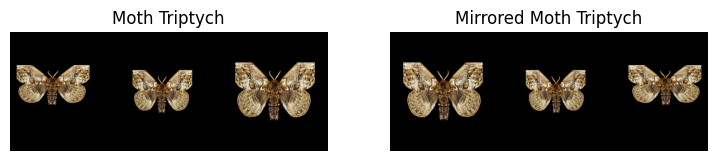

In [161]:
path = "data/input/moth_triptych.png"
im = cv2.imread(path, 0)
mirror_im = np.fliplr(im)

im_c = cv2_imread(path)
m_im_c = np.fliplr(im_c)

plt.figure(figsize=(9,7))
plt.subplot(1,2,1)
plt.imshow(im_c)
plt.axis('off')
plt.title('Moth Triptych')

plt.subplot(1,2,2)
plt.imshow(m_im_c)
plt.axis('off')
plt.title('Mirrored Moth Triptych')
plt.show()


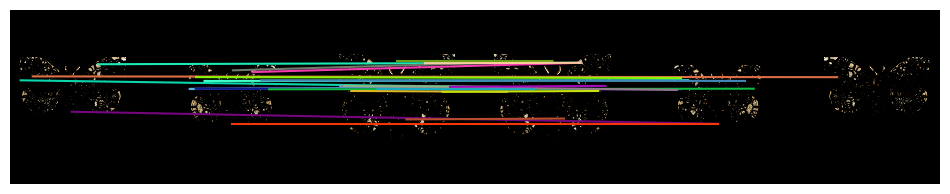

In [162]:
kps, descs, _, _, mir_descs = create_mirror_descriptors(im)
matches = match_mirror_descriptors(descs, mir_descs, threshold=0.5)
fig, ax = plt.subplots(1, 1, figsize=(12, 10))
ax.axis('off')
plot_mirror_matches(ax, im_c, kps, matches)
plt.show()


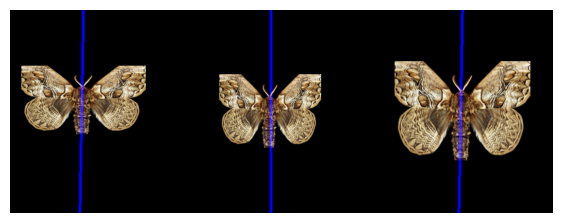

In [163]:
candidate_rhos, candidate_thetas = hough_vote_mirror(matches, kps, im.shape, window=1, threshold=0.001, num_lines=15)

selected = []
for rho, theta in sorted(zip(candidate_rhos, candidate_thetas), key=lambda x: x[0]):
    deviation = min(abs(theta), abs(theta - np.pi), abs(theta - 2*np.pi))
    if deviation >= 0.05 or rho < 0 or rho > im.shape[1]:
        continue
    if selected and abs(rho - selected[-1][0]) <= 120:
        continue
    selected.append((rho, theta))
    if len(selected) == 3:
        break

rhos = np.array([rho for rho, _ in selected])
thetas = np.array([theta for _, theta in selected])
draw_mirror_line(im_c.copy() , rhos, thetas)


Expected answer:

<img src="data/output/moth_triptych_symmetry.png" width="300" height="200">


This is the end of this lab. Good job!